# Setup

In [108]:
import pandas as pd
import numpy as np
import os

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
import seaborn as sns

import tarfile
import urllib

import missingno as msno
from pandas_profiling import ProfileReport


from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, StandardScaler
from sklearn.pipeline import Pipeline


from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import feature_selection  
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LassoCV
from sklearn.ensemble import ExtraTreesClassifier

from autofeat import AutoFeatClassifier

from statsmodels.stats.outliers_influence import variance_inflation_factor

## Get the data

The `IBM HR Analytics Employee Attrition & Performance` dataset can be fount at https://www.kaggle.com/pavansubhasht/ibm-hr-analytics-attrition-dataset

In [107]:
dir_path = "../"
data_path = os.path.join(dir_path, "data")
original_file_path = os.path.join(data_path, "hr_attrition.csv")

In [72]:
df = pd.read_csv(original_file_path)
# remove the ID-like column
df = df.drop(['EmployeeNumber'], axis=1)
df.head()


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,3,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,4,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,1,...,4,80,1,6,3,3,2,2,2,2


## Output Function

**This output is the culmination of the entire notebook**<br>
It's placed up here for convenience

This custom function takes in the dataset, then returns the cleaned version as well as an array containing the original values for the two label encoded variables - `JobRole` and `EducationField`

In [73]:
### returns split data that has been standardized
def standardize(data):
    # first dropping the unnecessary columns
    if 'EmployeeCount' in list(data.columns):
        data = data.drop(['EmployeeCount', 'EmployeeNumber', 'StandardHours', 'Over18'], axis = 'columns')
        
    # categorizing features
    ohe_vars = ['Department', 'Gender', 'MaritalStatus', 'OverTime']
    ordinal_vars = ['BusinessTravel', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance']
    lab_vars = ['EducationField', 'JobRole']
    
    df_num = [] # list of numerical variables
    cat_vars = ordinal_vars + ohe_vars + lab_vars
    cat_vars.append('Attrition') # target variable
    for i in list(data.columns):
        if i not in cat_vars:
            df_num.append(i)
    
    # standardizing numerical variables
    sc = StandardScaler()
    X = data[df_num]
    y = data['Attrition']
    X_train, X_val_test, y_std_train, y_val_test = train_test_split(X, y, test_size = 0.3, random_state = 6)
    X_val, X_test, y_std_val, y_std_test = train_test_split(X_val_test, y_val_test, test_size = 0.5, random_state = 6)
    X_std_train = sc.fit_transform(X_train)
    X_std_test = sc.transform(X_test)
    X_std_val = sc.transform(X_val)
    
    
    return X_std_train, X_std_test, X_std_val, y_std_train, y_std_test, y_std_val


### returns DataFrame with non-standardized numerical variables and encoded categorical variables
def transform_encoding(data):
    # first dropping the unnecessary columns
    for i in ['EmployeeCount', 'EmployeeNumber', 'StandardHours', 'Over18']:
        if i in list(data.columns):
            data = data.drop(i, axis = 'columns')
    
    # categorizing features
    ohe_vars = ['Department', 'Gender', 'MaritalStatus', 'OverTime']
    ordinal_vars = ['BusinessTravel', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance']
    lab_vars = ['EducationField', 'JobRole']
    
    # filtering the data to exclude outliers in the YearsAtCompany and TotalWorkingYears variables
    data = data[data['YearsAtCompany'] < 30]
    data = data[data['TotalWorkingYears'] < 30]
    
    # ordinal encoding of the ordinal variables
    if type(data['BusinessTravel'][0]) == str:
        data['BusinessTravel'] = data['BusinessTravel'].replace({'Non-Travel': 0, 'Travel_Rarely': 1, 'Travel_Frequently': 2})
    ord_pipeline = Pipeline([('ord_enc', OrdinalEncoder())])
    data[ordinal_vars] = ord_pipeline.fit_transform(data[ordinal_vars])

    # label encoding the education field and job role
    lbl_edu = LabelEncoder()
    edu_encoded = lbl_edu.fit_transform(data[['EducationField']])
    lbl_job = LabelEncoder()
    job_encoded = lbl_job.fit_transform(data[['JobRole']])
    data['EducationField'] = edu_encoded
    data['JobRole'] = job_encoded
    
    # using pd.get_dummies in lieu of OneHotEncoder
    data = pd.concat([data, pd.get_dummies(data[ohe_vars], drop_first = True)], axis = 'columns')
    data = data.drop(ohe_vars, axis = 1)
    
    if type(data['Attrition'][0]) == str:
        data['Attrition'] = data['Attrition'].replace({'Yes': 1, 'No': 0})
    
    return data

In [74]:
df_enc = transform_encoding(df)
df_enc.head()

C:\Users\USER\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


,Age,Attrition,BusinessTravel,DailyRate,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,HourlyRate,JobInvolvement,...,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Department_Research & Development,Department_Sales,Gender_Male,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1,1.0,1102,1,1.0,1,1.0,94,2.0,...,6,4,0,5,0,1,0,0,1,1
1,49,0,2.0,279,8,0.0,1,2.0,61,1.0,...,10,7,1,7,1,0,1,1,0,0
2,37,1,1.0,1373,2,1.0,4,3.0,92,1.0,...,0,0,0,0,1,0,1,0,1,1
3,33,0,2.0,1392,3,3.0,1,3.0,56,2.0,...,8,7,3,0,1,0,0,1,0,1
4,27,0,1.0,591,2,0.0,3,0.0,40,2.0,...,2,2,2,2,1,0,1,1,0,0


----

## Data Exploration

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 34 columns):
Age                         1470 non-null int64
Attrition                   1470 non-null object
BusinessTravel              1470 non-null object
DailyRate                   1470 non-null int64
Department                  1470 non-null object
DistanceFromHome            1470 non-null int64
Education                   1470 non-null int64
EducationField              1470 non-null object
EmployeeCount               1470 non-null int64
EnvironmentSatisfaction     1470 non-null int64
Gender                      1470 non-null object
HourlyRate                  1470 non-null int64
JobInvolvement              1470 non-null int64
JobLevel                    1470 non-null int64
JobRole                     1470 non-null object
JobSatisfaction             1470 non-null int64
MaritalStatus               1470 non-null object
MonthlyIncome               1470 non-null int64
MonthlyRate           

In [76]:
df.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithC

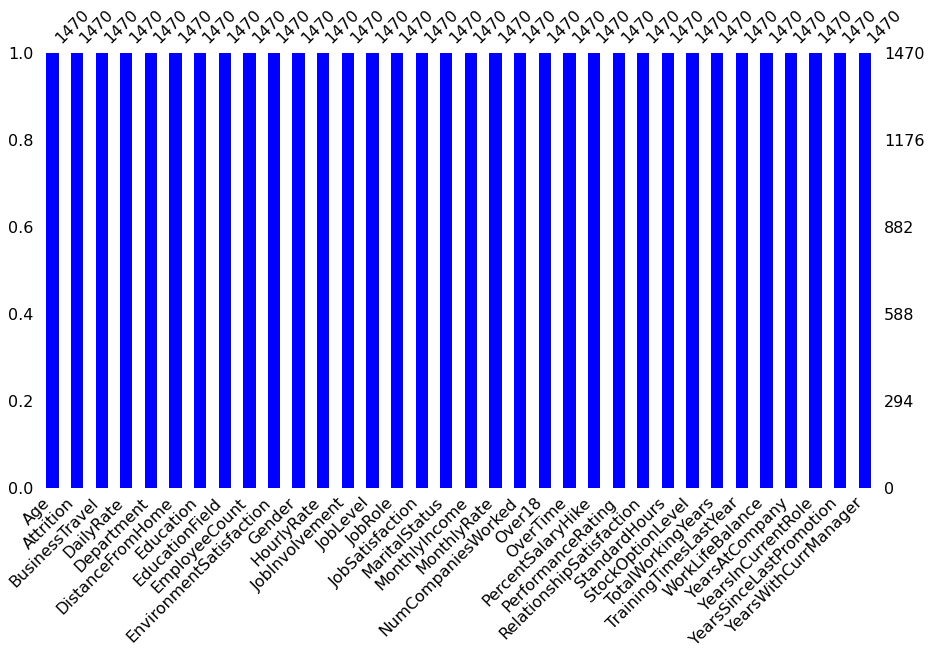

In [77]:
msno.bar(df, color = 'b', figsize = (15,8))

No null values in this dataset - no need for imputation, then

In [78]:
df.describe(include=['O'])

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
count,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,2,3,3,6,2,9,3,1,2
top,No,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Married,Y,No
freq,1233,1043,961,606,882,326,673,1470,1054


In [79]:
# Check Unique Values for categorical data
print('Unique Attrition Values: ' + str(df.Attrition.unique()) + '\n')
print('Unique Business Travel Values: ' + str(df.BusinessTravel.unique()) + '\n')
print('Unique Dept Values: ' + str(df.Department.unique()) + '\n')
print('Unique Education Field Values: ' + str(df.EducationField.unique()) + '\n')
print('Unique Gender Values: ' + str(df.Gender.unique()) + '\n')
print('Unique Job Role Values: ' + str(df.JobRole.unique()) + '\n')
print('Unique Marital Status Values: ' + str(df.MaritalStatus.unique()) + '\n')
print('Unique Over18 Values: ' + str(df.Over18.unique()) + '\n')
print('Unique OverTime Values: ' + str(df.OverTime.unique()) + '\n')

Unique Attrition Values: ['Yes' 'No']

Unique Business Travel Values: ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']

Unique Dept Values: ['Sales' 'Research & Development' 'Human Resources']

Unique Education Field Values: ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']

Unique Gender Values: ['Female' 'Male']

Unique Job Role Values: ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']

Unique Marital Status Values: ['Single' 'Married' 'Divorced']

Unique Over18 Values: ['Y']

Unique OverTime Values: ['Yes' 'No']



In [80]:
cat_columns =[]
for col, value in df.drop(['Attrition'], axis=1).iteritems():
    if value.dtype == 'object':
        cat_columns.append(col)
num_columns = df.drop(['Attrition'], axis=1).columns.difference(cat_columns)
print("categorical columns - %s" %(cat_columns))
print("")
print("numerical columns - %s" %(num_columns))

categorical columns - ['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime']

numerical columns - Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel',
       'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StandardHours', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')


References for some of the categorical variables with different values:<br>
- `Education`:
    - 1: Below College
    - 2: College
    - 3: Bachelor
    - 4: Master
    - 5: Doctor
- `EnvironmentSatisfaction`:
    - 1: Low
    - 2: Medium
    - 3: High
    - 4: Very High
- `JobInvolvement`:
    - 1: Low
    - 2: Medium
    - 3: High
    - 4: Very High
- `JobSatisfaction`:
    - 1: Low
    - 2: Medium
    - 3: High
    - 4: Very High
- `PerformanceRating`:
    - 1: Low
    - 2: Good
    - 3: Excellent
    - 4: Outstanding
- `RelationshipSatisfaction`:
    - 1: Low
    - 2: Medium
    - 3: High
    - 4: Very High
- `WorkLifeBalance`:
    - 1: Bad
    - 2: Good
    - 3: Better
    - 4: Best

In [81]:
profile = ProfileReport(df, title='HR Analytics Report', explorative=True)
profile

Summarize dataset:   0%|          | 0/47 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [82]:
df.describe()[df.describe().columns[:9]]

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,2.721769,65.891156,2.729932,2.063946
std,9.135373,403.509100,8.106864,1.024165,0.0,1.093082,20.329428,0.711561,1.106940
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,30.000000,1.000000,1.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,2.000000,48.000000,2.000000,1.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,3.000000,66.000000,3.000000,2.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,4.000000,83.750000,3.000000,3.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,4.000000,100.000000,4.000000,5.000000


In [83]:
df.describe()[df.describe().columns[9:17]]

,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0
mean,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0
std,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0
min,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0
25%,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0
50%,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0
75%,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0
max,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0


In [84]:
df.describe()[df.describe().columns[17:]]

,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


Right away, we can see that `StandardHours` and `EmployeeCount` have been standardized to a uniform level. We can drop these without losing any information.

In [85]:
df = df.drop(['EmployeeCount', 'StandardHours'], axis = 'columns')

In [86]:
# Correlation
df.corr()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,0.208034,0.010146,0.024287,0.029820,0.509604,-0.004892,0.497855,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.016806,0.018355,0.023381,0.046135,0.002966,0.030571,0.007707,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,-0.016075,0.031131,0.008783,0.005303,-0.003669,-0.017014,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.016806,0.021042,1.000000,-0.027128,0.016775,0.042438,0.101589,-0.011296,0.094961,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,1.000000,-0.049857,-0.008278,0.001212,-0.006784,-0.006259,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,0.023381,0.031131,0.016775,-0.049857,1.000000,0.042861,-0.027853,-0.071335,-0.015794,...,-0.002172,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,0.046135,0.008783,0.042438,-0.008278,0.042861,1.000000,-0.012630,-0.021476,-0.015271,...,-0.029071,0.034297,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,0.002966,0.005303,0.101589,0.001212,-0.027853,-0.012630,1.000000,-0.001944,0.950300,...,-0.021222,0.021642,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281
JobSatisfaction,-0.004892,0.030571,-0.003669,-0.011296,-0.006784,-0.071335,-0.021476,-0.001944,1.000000,-0.007157,...,0.002297,-0.012454,0.010690,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656
MonthlyIncome,0.497855,0.007707,-0.017014,0.094961,-0.006259,-0.015794,-0.015271,0.950300,-0.007157,1.000000,...,-0.017120,0.025873,0.005408,0.772893,-0.021736,0.030683,0.514285,0.363818,0.344978,0.344079


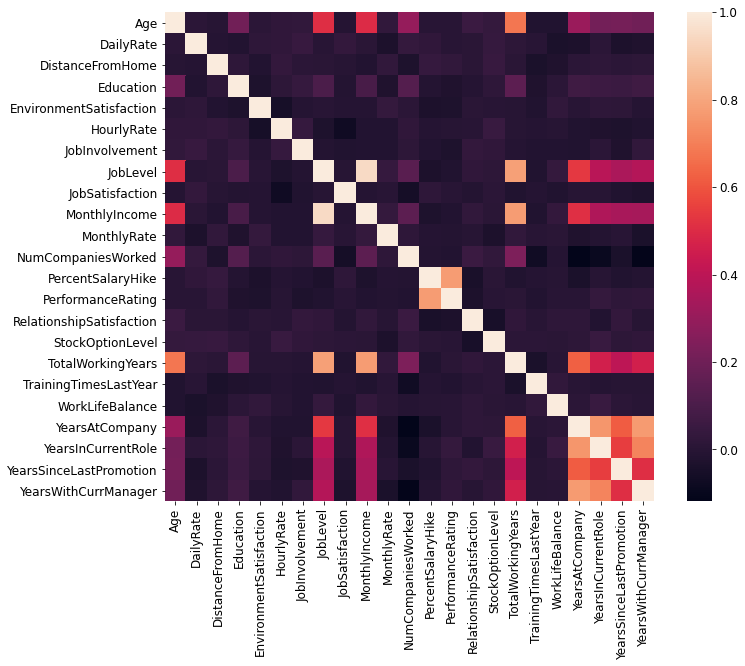

In [87]:
corrmat = df.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, square=True);

Some of the variables are clearly categorical, but were not given descriptions in the data dictionary. A list of all the numerical variables which appear categorical is as follows:
- `Education`
- `EnvironmentSatisfaction`
- `JobInvolvement`
- `JobLevel`
- `JobSatisfaction`
- `PerformanceRating`
- `RelationshipSatisfaction`
- `StockOptionLevel`
- `WorkLifeBalance`

Each of these variables seem to be ordinal (higher number is better). Ordinal Encoding can be used on these.

#### Non-numeric Columns

In [88]:
# listing the variables not included in the describe() function - not numerical
desc_cols = list(df.describe().columns)
df_cols = list(df.columns)

df[list(np.setdiff1d(df_cols, desc_cols))]

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
...,...,...,...,...,...,...,...,...,...
1465,No,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
1466,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No
1467,No,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes
1468,No,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No


(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

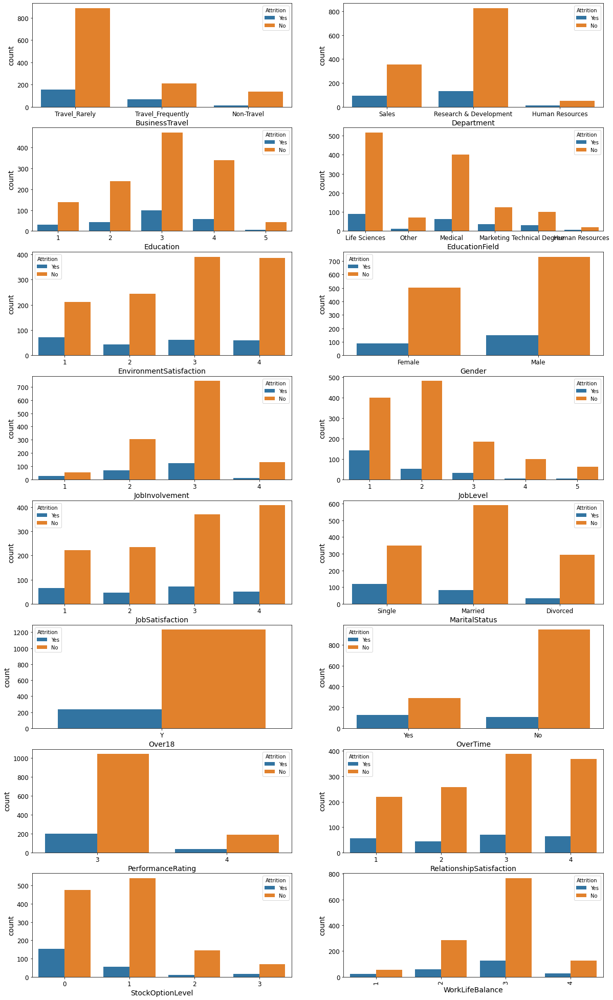

In [89]:
cate = ['BusinessTravel','Department','Education', 'EducationField','EnvironmentSatisfaction', 'Gender',
       'JobInvolvement','JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus','Over18','OverTime', 
       'PerformanceRating','RelationshipSatisfaction', 'StockOptionLevel','WorkLifeBalance']

f, axes = plt.subplots(8,2, figsize=(20,35))

sns.countplot(x='BusinessTravel',hue='Attrition',ax=axes[0,0],data=df)
sns.countplot(x='Department',hue='Attrition',ax=axes[0,1],data=df)
sns.countplot(x='Education',hue='Attrition',ax=axes[1,0],data=df)
sns.countplot(x='EducationField',hue='Attrition',ax=axes[1,1],data=df)
sns.countplot(x='EnvironmentSatisfaction',hue='Attrition',ax=axes[2,0],data=df)
sns.countplot(x='Gender',hue='Attrition',ax=axes[2,1],data=df)
sns.countplot(x='JobInvolvement',hue='Attrition',ax=axes[3,0],data=df)
sns.countplot(x='JobLevel',hue='Attrition',ax=axes[3,1],data=df)
sns.countplot(x='JobSatisfaction',hue='Attrition',ax=axes[4,0],data=df)
sns.countplot(x='MaritalStatus',hue='Attrition',ax=axes[4,1],data=df)
sns.countplot(x='Over18',hue='Attrition',ax=axes[5,0],data=df)
sns.countplot(x='OverTime',hue='Attrition',ax=axes[5,1],data=df)
sns.countplot(x='PerformanceRating',hue='Attrition',ax=axes[6,0],data=df)
sns.countplot(x='RelationshipSatisfaction',hue='Attrition',ax=axes[6,1],data=df)
sns.countplot(x='StockOptionLevel',hue='Attrition',ax=axes[7,0],data=df)
sns.countplot(x='WorkLifeBalance',hue='Attrition',ax=axes[7,1],data=df)


plt.xticks(rotation=90)


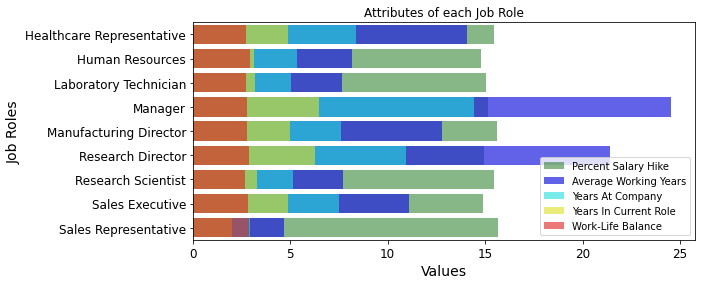

In [90]:
jobrole=pd.DataFrame(df.groupby("JobRole")["PercentSalaryHike","YearsAtCompany","TotalWorkingYears","YearsInCurrentRole","WorkLifeBalance"].mean())
f,ax = plt.subplots(figsize = (9,4))
sns.barplot(x=jobrole.PercentSalaryHike,y=jobrole.index,color='green',alpha = 0.5,label='Percent Salary Hike' )
sns.barplot(x=jobrole.TotalWorkingYears,y=jobrole.index,color='blue',alpha = 0.7,label='Average Working Years')
sns.barplot(x=jobrole.YearsAtCompany,y=jobrole.index,color='cyan',alpha = 0.6,label='Years At Company')
sns.barplot(x=jobrole.YearsInCurrentRole,y=jobrole.index,color='yellow',alpha = 0.6,label='Years In Current Role')
sns.barplot(x=jobrole.WorkLifeBalance,y=jobrole.index,color='red',alpha = 0.6,label='Work-Life Balance')

ax.legend(loc='lower right',frameon = True)     
ax.set(xlabel='Values', ylabel='Job Roles',title = "Attributes of each Job Role")
plt.show()

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 <a list of 9 Text major ticklabel objects>)

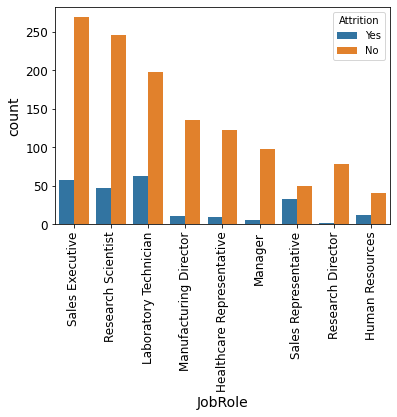

In [91]:
sns.countplot(x='JobRole',hue='Attrition',data=df)
plt.xticks(rotation=90)

In [92]:
df['Over18'].value_counts()

Y    1470
Name: Over18, dtype: int64

In [93]:
# dropping Over18 - useless variable here
df = df.drop('Over18', axis = 'columns')

In [94]:
df['BusinessTravel'].value_counts()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

In [95]:
df['Department'].value_counts()

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

In [96]:
df['EducationField'].value_counts()

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64

In [97]:
df['Gender'].value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

In [98]:
df['JobRole'].value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

In [99]:
df['MaritalStatus'].value_counts()

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64

In [100]:
df['OverTime'].value_counts()

No     1054
Yes     416
Name: OverTime, dtype: int64

#### Histogram of all numerical variables

C:\Users\USER\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\USER\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
C:\Users\USER\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:313: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
C:\Users\USER\Anaconda3\lib\site-packages\pandas\plotting\_matplotli

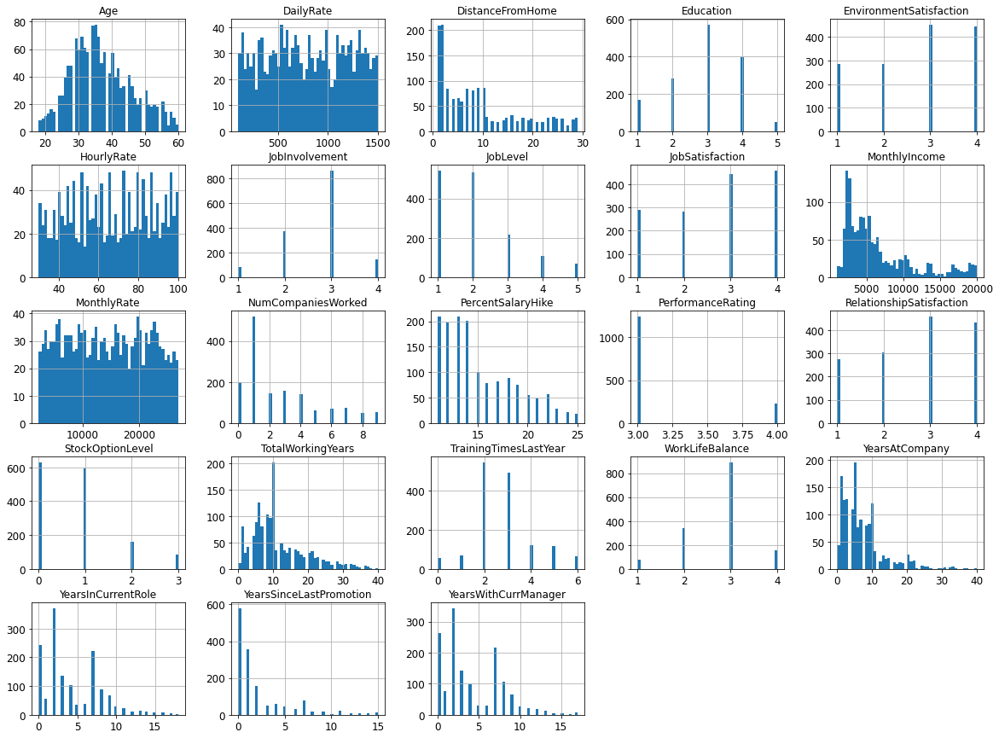

In [101]:
df.hist(bins=50, figsize=(20,15))
plt.show()

#### Distribution in the dataset

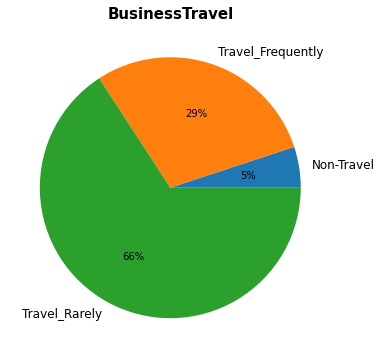

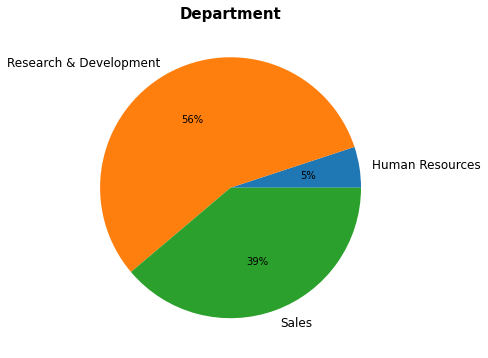

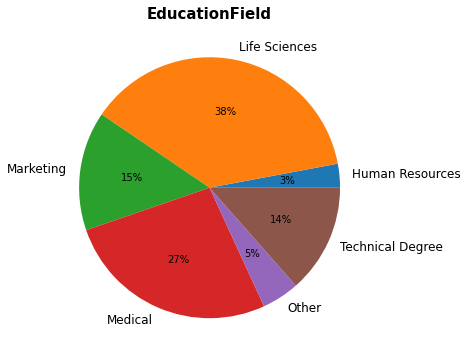

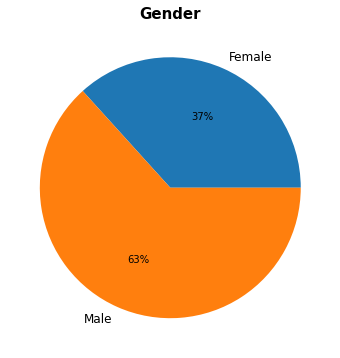

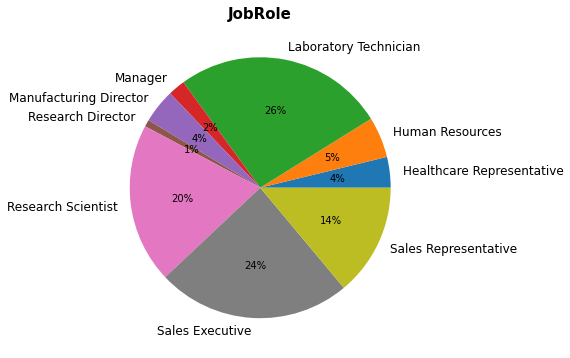

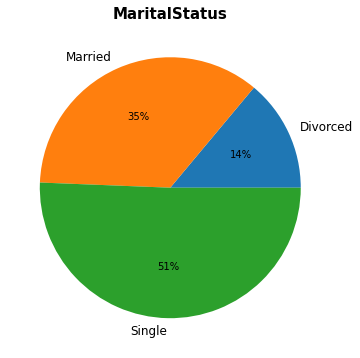

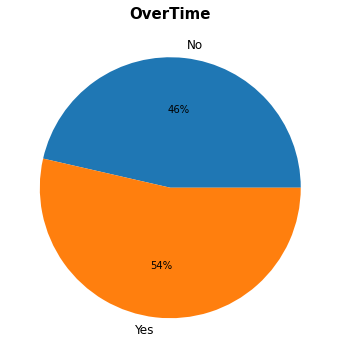

In [102]:
df['Attrition'] = df['Attrition'].replace({'Yes':1,'No':0})
cat_cols = df.select_dtypes(include = 'object')
for x in cat_cols.columns:
    z = pd.crosstab(df[x],df['Attrition'])
    plt.figure(figsize = (10,6))
    plt.pie(z[1], labels = z.index, autopct='%1.0f%%')
    plt.title(x,fontweight='bold',size=15)
    plt.show()

#### Check if the data is imbalanced

In [103]:
df['Attrition'].value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

In [104]:
total_rows = df.shape[0]
class_0 = df.Attrition.value_counts()[0]
class_1 = df.Attrition.value_counts()[1]
print('Percentage of NO Values: ' + str((class_0/total_rows) * 100))
print('Percentage of YES Values: ' + str((class_1/total_rows) * 100))

plt.figure(figsize = (7, 7))
plt.pie([yes_val, no_val], labels=['YES', 'NO'], autopct='%1.0f%%', colors = ['lightgreen','#66b3ff'])
plt.title("Check if the data is imbalanced", fontsize=20)
plt.show()

Percentage of NO Values: 83.87755102040816
Percentage of YES Values: 16.122448979591837


NameError: name 'yes_val' is not defined

<Figure size 504x504 with 0 Axes>

## Encoding Variables

The first hurdle in preparing this dataset is going to be encoding all the categorical variables. There are a number of variables which can be encoded ordinally (namely the numerical ones above). Others cannot be, and may need to be dealt with using other methods (like one hot or label encoding).

#### Ordinal Encoding

In [ ]:
# variables which can be dealt with using ordinal encoding
ordinal_vars = ['BusinessTravel', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance']
# business travel is currently input as a string array - changing to numerical values
df['BusinessTravel'] = df['BusinessTravel'].replace('Non-Travel', 0)
df['BusinessTravel'] = df['BusinessTravel'].replace('Travel_Rarely', 1)
df['BusinessTravel'] = df['BusinessTravel'].replace('Travel_Frequently', 2)

In [ ]:
ord_enc = OrdinalEncoder()
ordinal_vars_encoded = ord_enc.fit_transform(df[ordinal_vars])
ordinal_vars_encoded[:5]

Next up is to deal with categorical variables which are not ordinal. The list of these such variables is as follows:
- `Attrition` (**Target Variable**)
- `Department`
- `EducationField`
- `Gender`
- `JobRole`
- `MaritalStatus`
- `OverTime`

In [ ]:
other_vars = ['Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']
# number of unique values in each of these fields
for i in other_vars:
    print(i + ": " + str(df[i].nunique()))

#### One Hot Encoding

Department, gender, marital status, and overtime can use one hot encoding since there are very few unique values in those categories. <br>
Education field and job role should use label encoding since they are high cardinality nominal data fields.

In [ ]:
ohe_vars = ['Department', 'Gender', 'MaritalStatus', 'OverTime']
ohe = OneHotEncoder()
ohe_vars_encoded = ohe.fit_transform(df[ohe_vars])
ohe_vars_encoded = ohe_vars_encoded.toarray()
ohe_vars_encoded[:5]

In [ ]:
ohe.categories_

#### Label Encoding

In [ ]:
# label encoding
lab_vars = ['EducationField', 'JobRole']
lbl_edu = LabelEncoder()
edu_encoded = lbl_edu.fit_transform(df[['EducationField']])

lbl_job = LabelEncoder()
job_encoded = lbl_job.fit_transform(df[['JobRole']])

In [ ]:
df_test = df.copy()
df_test.head()

In [ ]:
df_test = pd.concat([df_test, pd.get_dummies(df_test[ohe_vars], drop_first = True)], axis = 'columns') #easier than sklearn OHE
df_test = df_test.drop(ohe_vars, axis = 1)
df_test['EducationField'] = edu_encoded
df_test['JobRole'] = job_encoded
df_test[ordinal_vars] = ordinal_vars_encoded

df_test.head()

In [ ]:
df_test['Attrition'] = df_test['Attrition'].replace({'Yes': 1, 'No': 0})
df_test.head()

## Outlier Filtering

Before passing into any models, some outliers must be removed from the dataset. For this, we set limits on the employee years at the company, and total working years. <br>
Age is not limited here, as it could be useful for the company to predict attrition rates considering age (i.e. employees close to retirement are more likely to retire). This can help to decrease the level of surprise when an employee announces their retirement, and could help the company to move on more efficiently.<br>
We do set some limits on the total working years and the years at the company, though. There are long right tails that could skew due to outliers in these categories.

In [ ]:
df.describe()[['YearsAtCompany', 'TotalWorkingYears']]

The dataset is capped at 40 years already for each of these variables, it would appear.

In [ ]:
df[['YearsAtCompany', 'TotalWorkingYears']].hist(bins=20, figsize=(20,15))
plt.show()

In [ ]:
df['YearsAtCompany'].value_counts()

In [ ]:
df['TotalWorkingYears'].value_counts()

For each of these variables, we remove observations that have >30 years as there are few of those observations in both categories.

In [ ]:
df_filter = df[df['TotalWorkingYears'] < 30]
df_filter = df_filter[df_filter['YearsAtCompany'] < 30]

## Numerical Standardization

Finally the numerical variables must be standardized in order to conduct meaningful analysis.

In [ ]:
df_num = []
cat_vars = ordinal_vars + ohe_vars + lab_vars
cat_vars.append('Attrition') # target variable
for i in list(df.columns):
    if i not in cat_vars:
        df_num.append(i)
        
df_num

In [ ]:
X = df[df_num]
y = df['Attrition']
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size = 0.3, random_state = 6)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5, random_state = 6)
sc = StandardScaler()
X_std_train = sc.fit_transform(X_train)
X_std_val = sc.transform(X_val)
X_std_test = sc.transform(X_test)
X_std_test

## Additional Outputs

#### Output 1 - Original Dataset <br>
This output is neither encoded nor standardized. It outputs the original dataset with dropped columns and rows as per descriptions above.

In [ ]:
def transform_original(data):
    if 'EmployeeCount' in list(data.columns):
        data = data.drop(['EmployeeCount', 'StandardHours', 'Over18'], axis = 'columns')
    data = data[data['YearsAtCompany'] < 30]
    data = data[data['TotalWorkingYears'] < 30]
    
    return data

In [ ]:
transform_original(df)

#### Output 2 - Non-standardized and Preprocessed<br>
This output contains the encoded versions of categorical variables, but not the standardized numerical variables

In [ ]:
def transform_encoding(data):
    # first dropping the unnecessary columns
    if 'EmployeeCount' in list(data.columns):
        data = data.drop(['EmployeeCount', 'StandardHours', 'Over18'], axis = 'columns')
    
    # categorizing features
    ohe_vars = ['Department', 'Gender', 'MaritalStatus', 'OverTime']
    ordinal_vars = ['BusinessTravel', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance']
    lab_vars = ['EducationField', 'JobRole']
    
    # filtering the data to exclude outliers in the YearsAtCompany and TotalWorkingYears variables
    data = data[data['YearsAtCompany'] < 30]
    data = data[data['TotalWorkingYears'] < 30]
    
    # ordinal encoding of the ordinal variables
    if type(data['BusinessTravel'][0]) == str:
        data['BusinessTravel'] = data['BusinessTravel'].replace({'Non-Travel': 0, 'Travel_Rarely': 1, 'Travel_Frequently': 2})
    ord_pipeline = Pipeline([('ord_enc', OrdinalEncoder())])
    data[ordinal_vars] = ord_pipeline.fit_transform(data[ordinal_vars])

    # label encoding the education field and job role
    lbl_edu = LabelEncoder()
    edu_encoded = lbl_edu.fit_transform(data[['EducationField']])
    lbl_job = LabelEncoder()
    job_encoded = lbl_job.fit_transform(data[['JobRole']])
    data['EducationField'] = edu_encoded
    data['JobRole'] = job_encoded
    
    # using pd.get_dummies in lieu of OneHotEncoder
    data = pd.concat([data, pd.get_dummies(data[ohe_vars], drop_first = True)], axis = 'columns')
    data = data.drop(ohe_vars, axis = 1)
    
    if type(data['Attrition'][0]) == str:
        data['Attrition'] = data['Attrition'].replace({'Yes': 1, 'No': 0})
    
    return data

In [ ]:
transform_encoding(df).head()

## Feature Selection

### 1. Collinearity


Using VIF values to find the multi-collinearity between predictors. The threshold is 10.

In [ ]:
df_dummied = transform_encoding(df)

df_dummied.shape

In [ ]:
df_dummied.columns

In [ ]:
y = df_dummied[['Attrition']]
X = df_dummied.drop(['Attrition'], axis=1)
X.shape

In [ ]:
# VIF dataframe 
vif_data = pd.DataFrame() 
vif_data["feature"] = X.columns 
  
# calculating VIF for each feature 
vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                          for i in range(len(X.columns))] 
  
print(vif_data)

In [ ]:
df['Department'].value_counts()

Based on the VIF scores and the understanding of columns, we found that the columns with high VIF scores are basically three types: time related, senior-level related, and departments related. The time related columns are `Age`,`TotalWorkingYears`and `YearsAtCompany`. They are strongly correlated becasue if an employee is older, normally his/her have more experience and probably spend more years at the company. The second category is salary related which are `HourlyRate`, `JobLevel`, `MonthlyIncome` and `PercentSalaryHike`. Similar reason to the first category, the higher job level, the more income, higher hourly rate and more salary hike. They are strongly correlated. The last category is the department includes `Department_Research & Development` and `Department_Sales`. They are correlated because they are dummified from the column `Department`. There are three types of departments values: Research & Development, Sales and Human Resources. However, HR only covers 4% while the majority are the other two departments. As the result, these two columns are correlated to each other since their values are highly possible to be the opposite of each other.


### 2. Mutual Information

In [ ]:

mic = feature_selection.mutual_info_classif(X, y,random_state=101)
mi_df = pd.DataFrame(
    {"feature": X.columns, "vimp": mic}
)

mi_df = mi_df.sort_values('vimp',ascending=True)

fig, ax = plt.subplots(figsize=(10, 8))
(
    mi_df
    .set_index("feature")
    .plot.barh(ax=ax)
)

With mutual information, the higher scores mean more dependent variables. The result is similar to VIF scores that age-related and job role/level related categories have the higher scores. However, the result from this method is highly affected by random states; in other words, the result can change completely by using different random states. 



### 3. feature importance

In [ ]:
# get feature importance by LassoCV estimator. 
# The features with the highest absolute coef_ value are considered the most important.
lasso = LassoCV().fit(X, y)
importance = np.abs(lasso.coef_)
feature_names = np.array(X.columns)
plt.figure(figsize=(15,10))
plt.barh(feature_names, importance)
plt.title("Feature importances via coefficients")
plt.show()



### 4. Tree-based Feature Selection

In [ ]:


clf = ExtraTreesClassifier(n_estimators=50, random_state=45)
clf = clf.fit(X, y)
feature_importance = clf.feature_importances_
  
# Normalizing the individual importances 
feature_importance_normalized = np.std([tree.feature_importances_ for tree in 
                                        clf.estimators_], 
                                        axis = 0) 

tbfs = pd.DataFrame(
    {"X": X.columns, "FI": feature_importance_normalized}
)

tbfs = tbfs.sort_values('FI',ascending=True)


# Plotting a Bar Graph to compare the models 
plt.figure(figsize=(15,10))
plt.barh(y=tbfs['X'],width=tbfs['FI']) 
plt.xlabel('Feature Labels') 
plt.ylabel('Feature Importances') 
plt.title('Comparison of different Feature Importances') 
plt.show() 

In [ ]:
# show the table results of predictors and feature importance
clf_df = pd.DataFrame(X.columns,columns=['X'])
clf_df['feature_importance']=feature_importance_normalized
clf_df.sort_values(by='feature_importance',ascending=False)

In [ ]:
# Get the filtered predictors

model = SelectFromModel(clf, prefit=True)
X_new = model.transform(X)
# df_new = pd.DataFrame(X_new)
# df_new

In [ ]:
# comparison
print("The original predictors have", X.shape[1],'columns, and there are', X_new.shape[1],'columns after feature selection.')

In [ ]:
# Indicating which columns are removed or remained by tree-based feature selection

features = pd.DataFrame(X.columns,columns=['Predictors'])
features['Feature selected'] = model.get_support()
features

In [ ]:
# Indicating only the columns are remained by tree-based feature selection
# (They are used for model development)
features.loc[features['Feature selected']==True]

Tree-based feature selection used the Tree-based estimators (ExtraTreesClassifier in this case)  to compute impurity-based feature importances, the tree-based estimator will naturally rank the features by the purity of the node. The purpose is to decrease theimpurity over all trees. With the tree, the nodes are organized while the nodes with greatest decrease in impurity are on the top of the tree, while the nodes with the least decrease in impurity occur at the end of trees (leaves). Thus, the most important features are ranked and selected by pruning trees below a particular node.

In [ ]:
list(features[features['Feature selected'] == True]['Predictors'])

### 4. Automated Feature Engineering

In [140]:
df_dummied = transform_encoding(df)
df_dummied.shape
y = df_dummied[['Attrition']]
X = df_dummied.drop(['Attrition'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3,random_state =4)
model = AutoFeatClassifier()
df = model.fit_transform(X, y)
print("Final Accuracy: %.4f" % model.score(df, y))

C:\Users\USER\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\USER\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
<string>:2: RuntimeWarning: divide by zero encountered in log
<string>:2: RuntimeWarning: divide by zero encountered in log
<string>:2: RuntimeWarning: divide by zero encountered in log
<string>:2: RuntimeWarning: divide by zero encountered in log
<string>:2: RuntimeWarning: divide by zero encountered in log
<string>:2: RuntimeWarning: divide by zero encountered in log
<string>:2: RuntimeWarning: divide by zero encountered in log
<string>:2: RuntimeWarning: divide by zero encount

KeyboardInterrupt: 